In [1]:
from __future__ import absolute_import, division, print_function, unicode_literals

%load_ext autoreload
%autoreload 2

import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
%matplotlib inline
%config InlineBackend.figure_format = 'retina'  # adapt plots for retina displays

from IPython.core.debugger import set_trace

In [14]:
import os
import utils
from tqdm.notebook import tqdm as tqdm_notebook
from sklearn.model_selection import train_test_split
import multiprocessing
import json

In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable
from torch.utils.data import Dataset, DataLoader

In [4]:
import datasets, models, interpretation

# Load model, dataset and brain area masks

In [5]:
!ls

data			     interpretation.py	small-dataset.ipynb
datasets.py		     LICENSE		softmax-output_state-dict.pt
figures			     models.py		training.ipynb
interpretation-mri.ipynb     __pycache__	utils.py
interpretation-photos.ipynb  README.md


In [6]:
net = models.ClassificationModel3D()
net.load_state_dict(torch.load('softmax-output_state-dict.pt'))

<All keys matched successfully>

In [7]:
if torch.cuda.is_available():
    net.cuda()
    cuda_device = torch.cuda.current_device()
    print('Moved network to GPU')
else:
    cuda_device = -1
    print('GPU not available')

Moved network to GPU


In [8]:
# Important: Set model to eval before using any interpretation methods
net.eval();

In [9]:
# Load the data table with all 1.5 Tesla MRI scans from ADNI.
df = datasets.load_data_table_15T()

Loading dataframe for data/ADNI/ADNI_tables/customized/DxByImgClean_CompleteAnnual2YearVisitList_1_5T.csv
Found 1590 images in table
Filtered out 2 of 1590 images because of failed preprocessing
Filtered out 0 of 1588 images because of missing files
Filtered out 619 of 1588 images that were MCI
Final dataframe contains 969 images from 344 patients



In [11]:
# Patient-wise train-test-split.
# Select a number of patients for each class, put all their images in the test set 
# and all other images in the train set. This is the split that is used in the paper to produce the heatmaps.
test_patients_per_class = 30

patients_AD = df[df['DX'] == 'Dementia']['PTID'].unique()
patients_CN = df[df['DX'] == 'CN']['PTID'].unique()
patients_CN = list(filter(lambda p: p not in patients_AD, patients_CN))  # patients that have both a CN and an AD scan should belong to the AD group

patients_AD_train, patients_AD_test = train_test_split(patients_AD, test_size=test_patients_per_class, random_state=0)
patients_CN_train, patients_CN_test = train_test_split(patients_CN, test_size=test_patients_per_class, random_state=0)

patients_train = np.concatenate([patients_AD_train, patients_CN_train])
patients_test = np.concatenate([patients_AD_test, patients_CN_test])

In [12]:
train_dataset, test_dataset = datasets.build_datasets(df, patients_train, patients_test, normalize=True)

         Images    -> AD    -> CN    Patients    -> AD    -> CN
-----  --------  -------  -------  ----------  -------  -------
All         969      475      494         344      193      151
Train       794      399      395         284      163      121
Val         175       76       99          60       30       30

Calculating mean and std for normalization:


  0%|          | 0/200 [00:00<?, ?it/s]

In [15]:
# Set up a binary mask for each brain area based on the AAL atlas.
# This is required for brain area occlusion and to determine the relevance per area.
# The AAL atlas can for example be retrieved from here: https://github.com/neurolabusc/MRIcron/blob/master/templates/aal.nii.gz
brain_map = utils.load_nifti('data/aal.nii.gz')
brain_areas = np.unique(brain_map)[1:]  # omit background

area_masks = []
for area in tqdm_notebook(brain_areas):
    area_mask = np.zeros_like(brain_map)
    area_mask[brain_map == area] = 1
    area_mask = utils.resize_image(area_mask, test_dataset.image_shape(), interpolation=0)
    area_masks.append(area_mask)

area_names = ['Precentral_L', 'Precentral_R', 'Frontal_Sup_L', 'Frontal_Sup_R', 'Frontal_Sup_Orb_L', 'Frontal_Sup_Orb_R', 'Frontal_Mid_L', 'Frontal_Mid_R', 'Frontal_Mid_Orb_L', 'Frontal_Mid_Orb_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Inf_Orb_L', 'Frontal_Inf_Orb_R', 'Rolandic_Oper_L', 'Rolandic_Oper_R', 'Supp_Motor_Area_L', 'Supp_Motor_Area_R', 'Olfactory_L', 'Olfactory_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'Rectus_L', 'Rectus_R', 'Insula_L', 'Insula_R', 'Cingulum_Ant_L', 'Cingulum_Ant_R', 'Cingulum_Mid_L', 'Cingulum_Mid_R', 'Cingulum_Post_L', 'Cingulum_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Amygdala_L', 'Amygdala_R', 'Calcarine_L', 'Calcarine_R', 'Cuneus_L', 'Cuneus_R', 'Lingual_L', 'Lingual_R', 'Occipital_Sup_L', 'Occipital_Sup_R', 'Occipital_Mid_L', 'Occipital_Mid_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Fusiform_L', 'Fusiform_R', 'Postcentral_L', 'Postcentral_R', 'Parietal_Sup_L', 'Parietal_Sup_R', 'Parietal_Inf_L', 'Parietal_Inf_R', 'SupraMarginal_L', 'SupraMarginal_R', 'Angular_L', 'Angular_R', 'Precuneus_L', 'Precuneus_R', 'Paracentral_Lobule_L', 'Paracentral_Lobule_R', 'Caudate_L', 'Caudate_R', 'Putamen_L', 'Putamen_R', 'Pallidum_L', 'Pallidum_R', 'Thalamus_L', 'Thalamus_R', 'Heschl_L', 'Heschl_R', 'Temporal_Sup_L', 'Temporal_Sup_R', 'Temporal_Pole_Sup_L', 'Temporal_Pole_Sup_R', 'Temporal_Mid_L', 'Temporal_Mid_R', 'Temporal_Pole_Mid_L', 'Temporal_Pole_Mid_R', 'Temporal_Inf_L', 'Temporal_Inf_R', 'Cerebelum_Crus1_L', 'Cerebelum_Crus1_R', 'Cerebelum_Crus2_L', 'Cerebelum_Crus2_R', 'Cerebelum_3_L', 'Cerebelum_3_R', 'Cerebelum_4_5_L', 'Cerebelum_4_5_R', 'Cerebelum_6_L', 'Cerebelum_6_R', 'Cerebelum_7b_L', 'Cerebelum_7b_R', 'Cerebelum_8_L', 'Cerebelum_8_R', 'Cerebelum_9_L', 'Cerebelum_9_R', 'Cerebelum_10_L', 'Cerebelum_10_R', 'Vermis_1_2', 'Vermis_3', 'Vermis_4_5', 'Vermis_6', 'Vermis_7', 'Vermis_8', 'Vermis_9', 'Vermis_10']

# Merge left and right areas.
merged_area_names = [name[:-2] for name in area_names[:108:2]] + area_names[108:]

  0%|          | 0/116 [00:00<?, ?it/s]

In [35]:
def get_relevance_per_area(relevance_map, normalize=True):
    relevances = np.zeros(len(area_masks))
    for i, area_mask in enumerate(area_masks):
        relevances[i] = np.sum(relevance_map * area_mask)
    if normalize:
        relevances /= relevances.sum()  # make all areas sum to 1

    # Merge left and right areas.
    merged_relevances = np.concatenate([relevances[:108].reshape(-1, 2).sum(1), relevances[108:]])

    return sorted(zip(merged_area_names, merged_relevances), key=lambda x: x[1], reverse=True)

# Relevance heatmaps for single images

## Raw image

0.0 660.0645582582652 None None


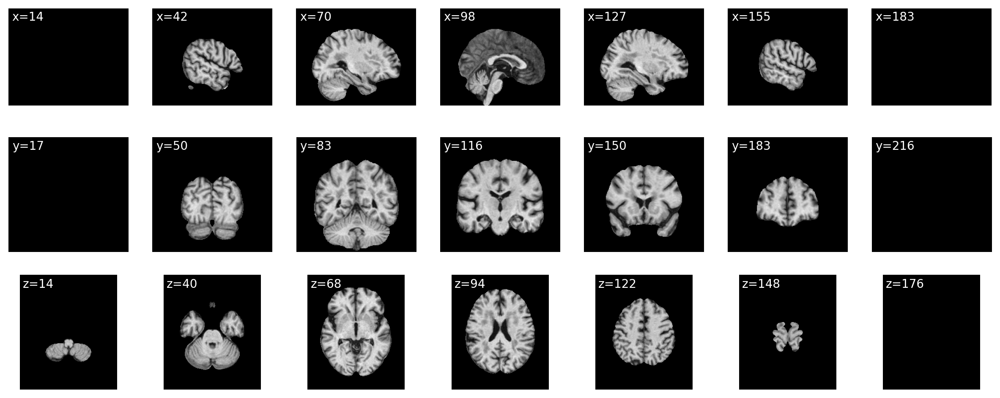

In [18]:
which = 1

image_tensor = test_dataset[which][0]
raw_image = test_dataset.get_raw_image(which)

utils.plot_slices(raw_image, num_slices=7)

## Sensitivity Analysis

In [19]:
relevance_map_backprop = interpretation.sensitivity_analysis(net, image_tensor, cuda=True, verbose=True)

/home/ntrougkas/Documents/3D-TAME/cnn-interpretability/interpretation.py:62: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.softmax(output)


Image was classified as tensor(1, device='cuda:0') with probability tensor(0.8555, device='cuda:0')


0.0 660.0645582582652 0.0 0.0008397687599063183


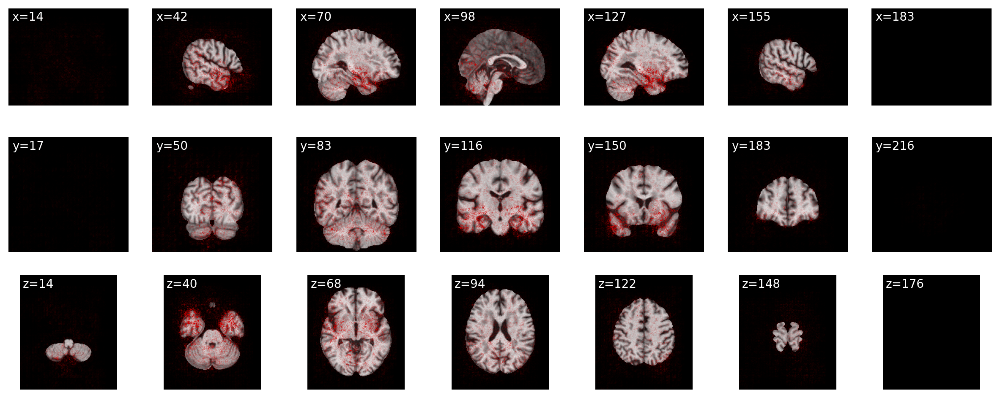

In [20]:
utils.plot_slices(raw_image, overlay=relevance_map_backprop[0], overlay_vmax=np.percentile(relevance_map_backprop, 99.9), overlay_cmap=utils.alpha_to_red_cmap)

In [21]:
get_relevance_per_area(relevance_map_backprop[0])[:10]

[('Temporal_Mid', 0.05765165459156965),
 ('Temporal_Inf', 0.05260983830932388),
 ('Fusiform', 0.04367805354550552),
 ('Lingual', 0.03137949168518471),
 ('Temporal_Sup', 0.031113141781901367),
 ('ParaHippocampal', 0.030449062272200213),
 ('Cerebelum_8', 0.028825050022165198),
 ('Frontal_Mid', 0.028555531322278612),
 ('Cerebelum_Crus1', 0.028076044310073933),
 ('Insula', 0.028057502239927954)]

## Guided Backpropagation

In [22]:
relevance_map_guided = interpretation.guided_backprop(net, image_tensor, cuda=True, verbose=True)

Registered hook for layer: ReLU()
Image was classified as tensor(1, device='cuda:0') with probability tensor(0.8555, device='cuda:0')
Removing 1 hook(s)


0.0 660.0645582582652 0.0 0.0001797381278593219


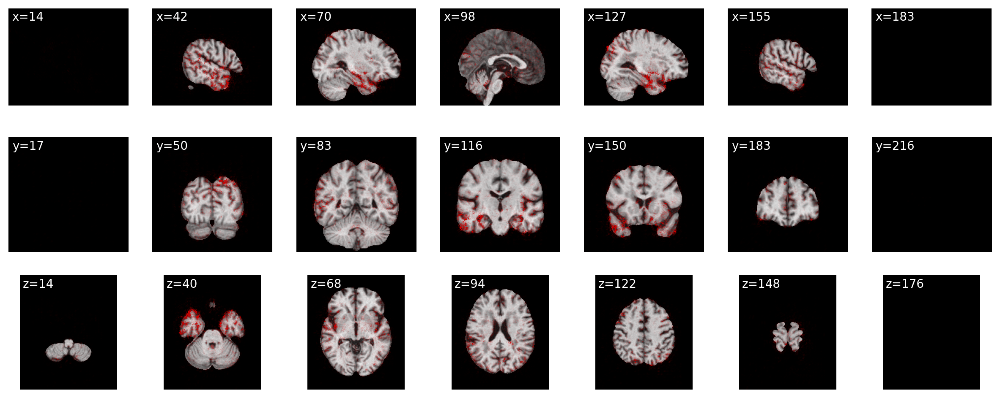

In [23]:
utils.plot_slices(raw_image, overlay=relevance_map_guided[0], overlay_vmax=np.percentile(relevance_map_guided, 99.9))

In [24]:
get_relevance_per_area(relevance_map_guided[0])[:10]

[('Temporal_Mid', 0.08359128345995995),
 ('Temporal_Inf', 0.05846417855651413),
 ('Temporal_Sup', 0.043794983895046886),
 ('Insula', 0.03966079130198953),
 ('Fusiform', 0.03965066469435272),
 ('Occipital_Mid', 0.03641296958459113),
 ('ParaHippocampal', 0.0344302143966662),
 ('Frontal_Mid', 0.03231685777535501),
 ('Temporal_Pole_Mid', 0.031924669293541506),
 ('Temporal_Pole_Sup', 0.03133269276354543)]

## Occlusion

In [25]:
relevance_map_occlusion = interpretation.occlusion(net, image_tensor, size=40, stride=25, cuda=True, resize=True, verbose=True)

Image was classified as 1 with probability tensor(0.8555)


/home/ntrougkas/Documents/3D-TAME/cnn-interpretability/interpretation.py:184: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.softmax(output)


x:   0%|          | 0/8 [00:00<?, ?it/s]

y:   0%|          | 0/10 [00:00<?, ?it/s]

z:   0%|          | 0/8 [00:00<?, ?it/s]

/home/ntrougkas/Documents/3D-TAME/cnn-interpretability/interpretation.py:238: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.softmax(output)


0.0 660.0645582582652 0.0 0.30020761489868164


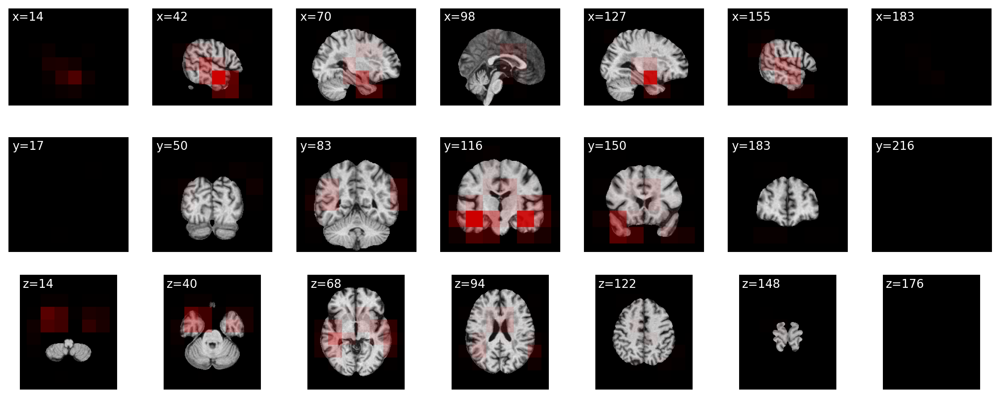

In [26]:
utils.plot_slices(raw_image, overlay=relevance_map_occlusion, overlay_cmap=utils.alpha_to_red_cmap)

0.0 660.0645582582652 0.0 0.30020761489868164


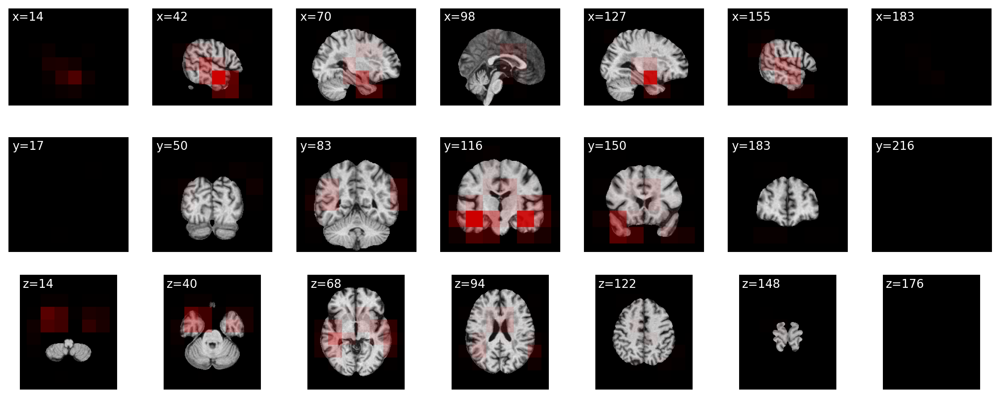

In [27]:
utils.plot_slices(raw_image, overlay=relevance_map_occlusion, overlay_cmap=utils.alpha_to_red_cmap)

In [28]:
get_relevance_per_area(relevance_map_occlusion)[:10]

[('Temporal_Mid', 0.1760164068851225),
 ('Temporal_Inf', 0.1203314084472627),
 ('Temporal_Sup', 0.10888529080292697),
 ('Hippocampus', 0.06669520889580507),
 ('Fusiform', 0.0658524941936027),
 ('Temporal_Pole_Sup', 0.04962508498236595),
 ('ParaHippocampal', 0.047518372777308124),
 ('Insula', 0.04590359639167081),
 ('Temporal_Pole_Mid', 0.03689613800879059),
 ('Rolandic_Oper', 0.026127696503497055)]

(-0.5, 188.5, 196.5, -0.5)

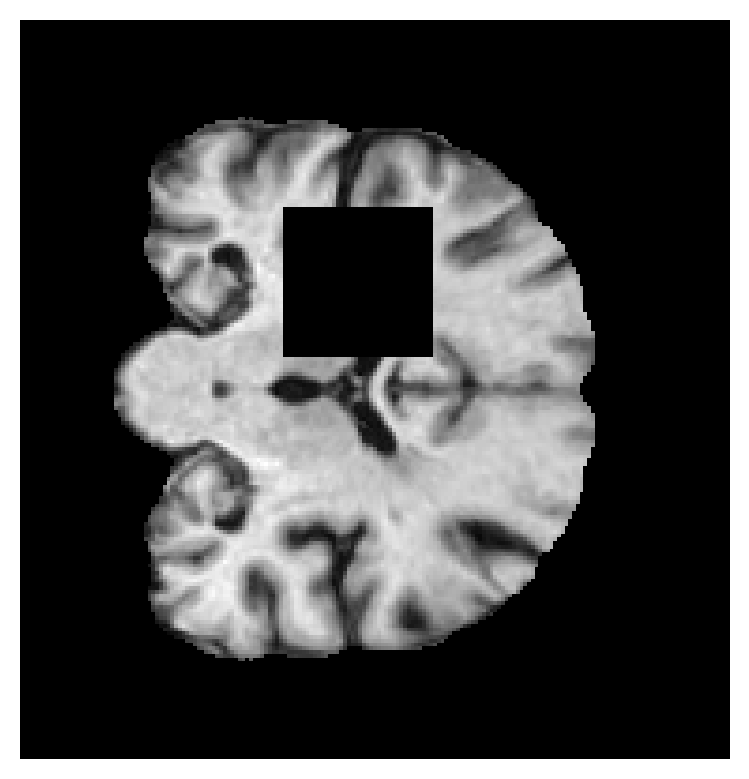

In [29]:
# Plot occlusion patch on image.
occluded_image = raw_image[:, 114, :].copy()
size = 40
occluded_image[50:50+size, 70:70+size] = 0
plt.imshow(occluded_image, cmap='gray')
plt.axis('off')

## Area Occlusion

In [36]:
relevance_map_area_occlusion = interpretation.area_occlusion(net, image_tensor, area_masks, cuda=True, verbose=True)

Image was classified as 1 with probability tensor(0.8555, device='cuda:0')


  0%|          | 0/116 [00:00<?, ?it/s]

torch.Size([1, 197, 233, 189])
torch.Size([197, 233, 189])


OutOfMemoryError: CUDA out of memory. Tried to allocate 258.00 MiB (GPU 0; 7.79 GiB total capacity; 5.71 GiB already allocated; 189.75 MiB free; 6.39 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

0.0 683.786425468 0.0 0.114823


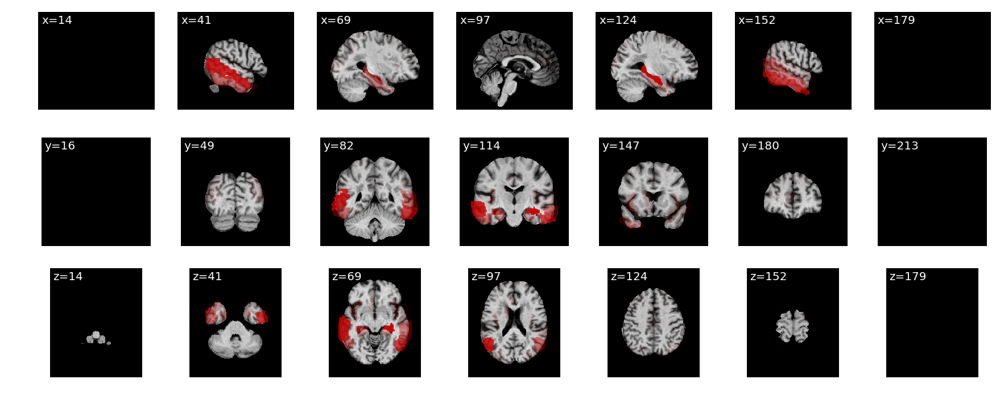

In [27]:
utils.plot_slices(raw_image, overlay=relevance_map_area_occlusion, overlay_cmap=utils.alpha_to_red_cmap)#, overlay_vmin=0, overlay_vmax=1)

In [28]:
get_relevance_per_area(relevance_map_area_occlusion)[:10]

[(u'Temporal_Mid', 0.41732934294010604),
 (u'Temporal_Inf', 0.26899544989393337),
 (u'Hippocampus', 0.1037580938155561),
 (u'Insula', 0.039489668503406079),
 (u'ParaHippocampal', 0.03670647952330057),
 (u'Occipital_Mid', 0.023253645867581444),
 (u'Temporal_Sup', 0.022765341133691098),
 (u'Temporal_Pole_Mid', 0.013203760299102422),
 (u'Angular', 0.0098604170389767175),
 (u'Temporal_Pole_Sup', 0.0097734423833484192)]

## Grad-CAM
Note: Grad-CAM doesn't work on this data. It's only included here for completeness, but I couldn't figure out if there's a bug in the implementation or if the method is not applicable to this kind of data and/or model.

In [37]:
# TODO: Something is apparently wrong with gradcam, try to fix it. Could also simply be because feature maps of last layer are just 4x5x4, so very small.

In [38]:
relevance_map_grad_cam = interpretation.grad_cam(net, image_tensor, cuda=True, resize=True, interpolation=0, verbose=True)

Found last conv layer: Conv3d(32, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1))
Stored feature maps
Image was classified as 1 with probability 0.85551083
tensor([[0., 1.]], device='cuda:0')
Stored gradient
-7.058373e-05 1.7046718e-06 3.2960976e-05
(64, 1, 1, 1)
(64, 12, 15, 12)
(12, 15, 12)
0.00010832765 0.00022387099 0.00040369318
0.00010832765 0.00022387099 0.00040369318


/home/ntrougkas/Documents/3D-TAME/.venv/lib/python3.8/site-packages/torch/nn/modules/module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/ntrougkas/Documents/3D-TAME/cnn-interpretability/interpretation.py:391: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.softmax(output)


0.0 660.0645582582652 0.0 572.0156941233384


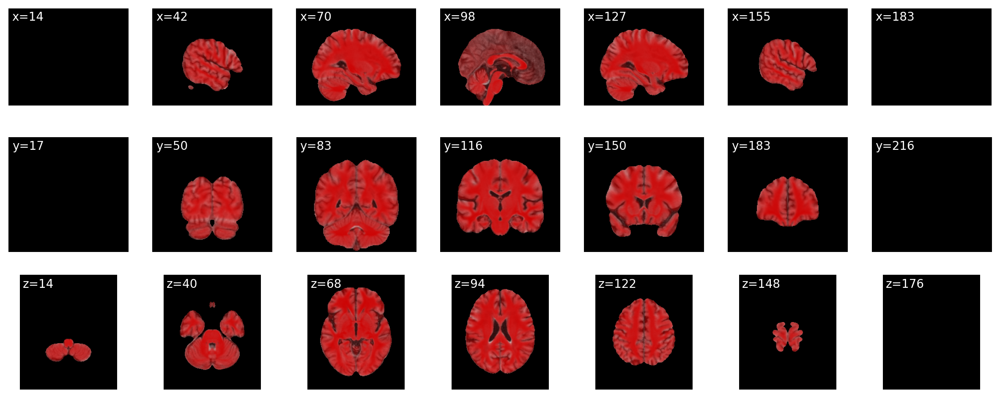

In [39]:
utils.plot_slices(raw_image, overlay=relevance_map_grad_cam * test_dataset.std + test_dataset.mean)

0.0 660.0645582582652 0.00010832765 0.00040369318


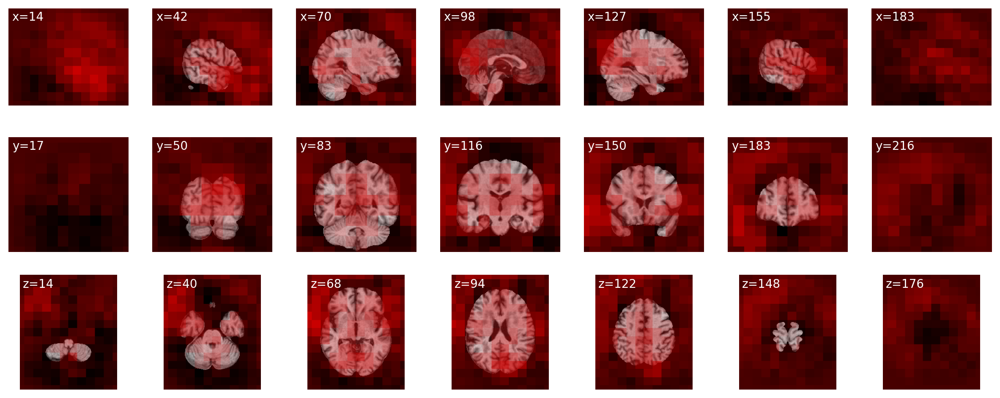

In [40]:
utils.plot_slices(raw_image, overlay=relevance_map_grad_cam)

0.00010832765 0.00040369318 None None


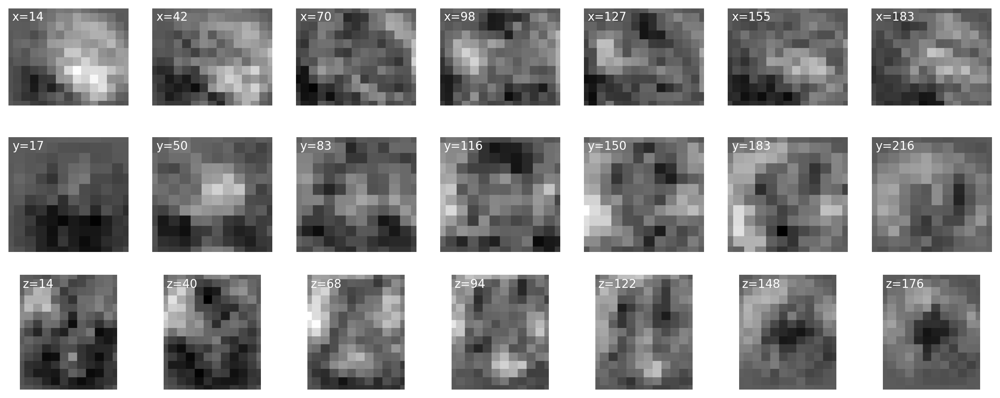

In [41]:
utils.plot_slices(relevance_map_grad_cam)

In [42]:
get_relevance_per_area(relevance_map_grad_cam)[:10]

[('Temporal_Mid', 0.0560355626263888),
 ('Frontal_Mid', 0.04574601123934434),
 ('Precuneus', 0.040427074785732875),
 ('Postcentral', 0.03900798860377929),
 ('Frontal_Sup', 0.03642729700599001),
 ('Temporal_Inf', 0.034641706467499325),
 ('Temporal_Sup', 0.03340254797308227),
 ('Occipital_Mid', 0.03209021759329625),
 ('Precentral', 0.03136172863203407),
 ('Frontal_Sup_Medial', 0.029125050744806286)]

# Relevance heatmaps averaged over the dataset
Plot an average relevance map of all Alzheimer and all control patients (in the test set). These are the kind of plots that are included in the paper.

In [43]:
# If None, average over the entire dataset, otherwise pick a number of samples.
num_samples=None

# The background over which to plot the heatmaps.
bg = test_dataset.mean

## Backpropagation

In [44]:
avg_relevance_map_AD_backprop, avg_relevance_map_NC_backprop, avg_relevance_map_all_backprop = interpretation.average_over_dataset(interpretation.sensitivity_analysis, net, test_dataset, num_samples=num_samples, seed=0, show_progress=True, cuda=True)

/home/ntrougkas/Documents/3D-TAME/cnn-interpretability/interpretation.py:62: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.softmax(output)


  0%|          | 0/175 [00:00<?, ?it/s]

0.0 571.9613556588048 0.0 0.00034712824644521747


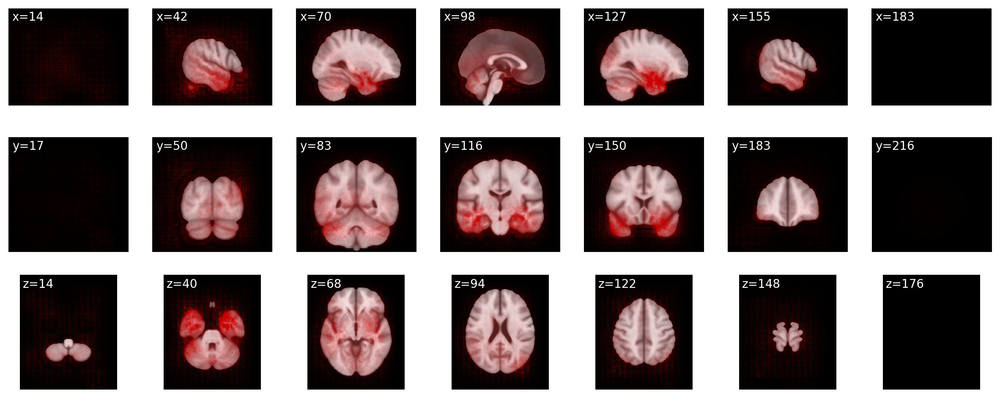

In [46]:
utils.plot_slices(bg, overlay=avg_relevance_map_AD_backprop[0], overlay_vmax=np.percentile(avg_relevance_map_AD_backprop, 99.9))

In [47]:
get_relevance_per_area(avg_relevance_map_AD_backprop)[:10]

[('Temporal_Mid', 0.06125002165582687),
 ('Temporal_Inf', 0.05566242338175735),
 ('Fusiform', 0.04344636779283329),
 ('Cerebelum_Crus1', 0.036396617653889116),
 ('Frontal_Mid', 0.031761409463832116),
 ('Occipital_Mid', 0.029161640329549342),
 ('Lingual', 0.028999737990871428),
 ('Precuneus', 0.02874520175001403),
 ('Temporal_Sup', 0.02872039581898491),
 ('Cerebelum_6', 0.0286993160823103)]

0.0 549.511221515 0.0 0.000317961236578


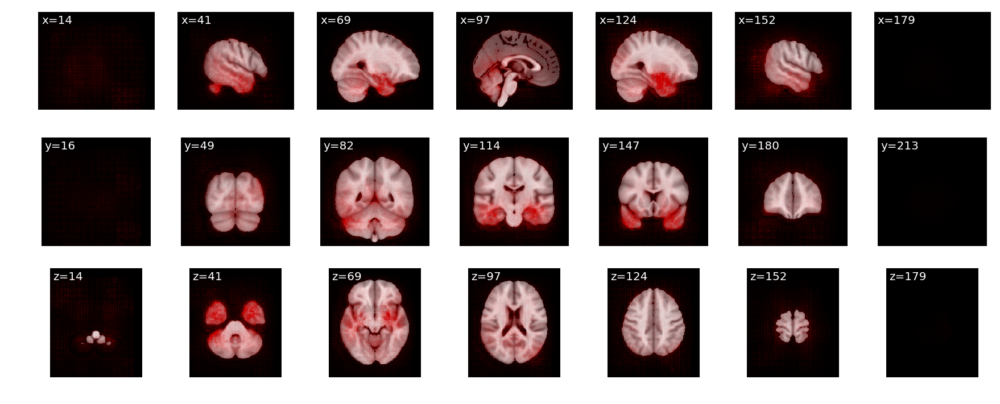

In [108]:
utils.plot_slices(bg, overlay=avg_relevance_map_NC_backprop[0], overlay_vmax=np.percentile(avg_relevance_map_NC_backprop, 99.9))

In [48]:
get_relevance_per_area(avg_relevance_map_NC_backprop)[:10]

[('Temporal_Mid', 0.06214783766336773),
 ('Temporal_Inf', 0.055939907836348904),
 ('Fusiform', 0.0424342165290518),
 ('Cerebelum_Crus1', 0.03642201231733795),
 ('Frontal_Mid', 0.032721834700357694),
 ('Occipital_Mid', 0.02972945439434773),
 ('Lingual', 0.02930453987270009),
 ('Precuneus', 0.029225882001383603),
 ('Temporal_Sup', 0.02871778951338382),
 ('Postcentral', 0.028671297387134177)]

## Guided Backpropagation

In [49]:
avg_relevance_map_AD_guided, avg_relevance_map_NC_guided, avg_relevance_map_all_guided = interpretation.average_over_dataset(interpretation.guided_backprop, net, test_dataset, num_samples=num_samples, seed=0, show_progress=True, cuda=True)

  0%|          | 0/175 [00:00<?, ?it/s]

0.0 571.9613556588048 0.0 5.5752707587089674e-05


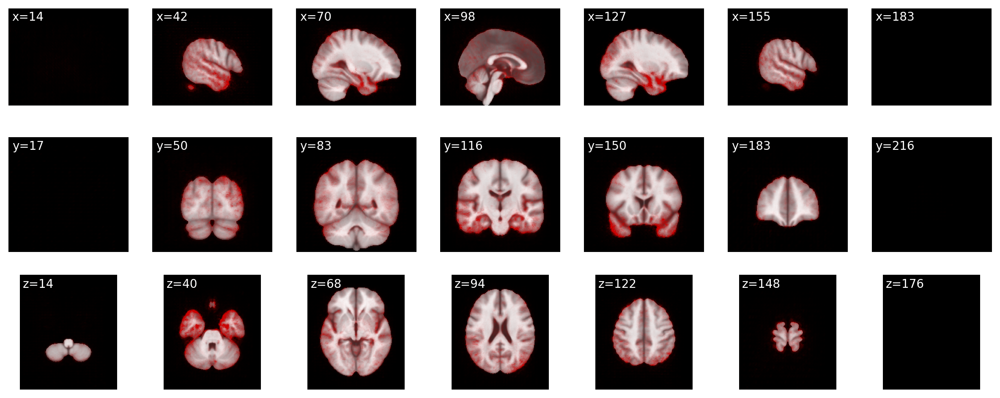

In [50]:
utils.plot_slices(bg, overlay=avg_relevance_map_AD_guided[0], overlay_vmax=np.percentile(avg_relevance_map_AD_guided, 99.9))

In [51]:
get_relevance_per_area(avg_relevance_map_AD_guided)[:10]

[('Temporal_Mid', 0.07132311904007747),
 ('Temporal_Inf', 0.05140847713223816),
 ('Frontal_Mid', 0.039370901548970196),
 ('Occipital_Mid', 0.03845316548023771),
 ('Temporal_Sup', 0.03564154537740198),
 ('Fusiform', 0.03496379167711609),
 ('Precuneus', 0.03441472299363771),
 ('Postcentral', 0.032446799220500394),
 ('Cerebelum_Crus1', 0.029035528631766557),
 ('Precentral', 0.02658305020896014)]

0.0 571.9613556588048 0.0 6.581651529995731e-05


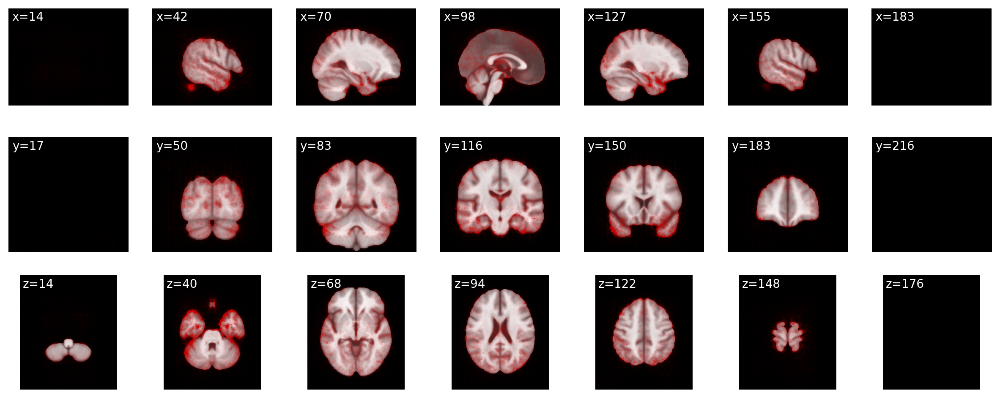

In [52]:
utils.plot_slices(bg, overlay=avg_relevance_map_NC_guided[0], overlay_vmax=np.percentile(avg_relevance_map_NC_guided, 99.9))

In [53]:
get_relevance_per_area(avg_relevance_map_NC_guided)[:10]

[('Temporal_Mid', 0.06112886014116759),
 ('Temporal_Inf', 0.04737665495081286),
 ('Frontal_Mid', 0.04044199437896144),
 ('Precuneus', 0.03680168094024909),
 ('Cerebelum_Crus1', 0.03646116727215351),
 ('Postcentral', 0.03564266564304937),
 ('Occipital_Mid', 0.035433862623886106),
 ('Fusiform', 0.03175225618581707),
 ('Temporal_Sup', 0.0316891578374767),
 ('Lingual', 0.030159680400979917)]

## Occlusion

In [54]:
avg_relevance_map_AD_occlusion, avg_relevance_map_NC_occlusion, avg_relevance_map_all_occlusion = interpretation.average_over_dataset(interpretation.occlusion, net, test_dataset, num_samples=num_samples, show_progress=True, size=40, stride=40, cuda=True)

/home/ntrougkas/Documents/3D-TAME/cnn-interpretability/interpretation.py:184: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.softmax(output)
/home/ntrougkas/Documents/3D-TAME/cnn-interpretability/interpretation.py:238: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.softmax(output)


  0%|          | 0/175 [00:00<?, ?it/s]

0.0 571.9613556588048 0.0 0.08144612845621611


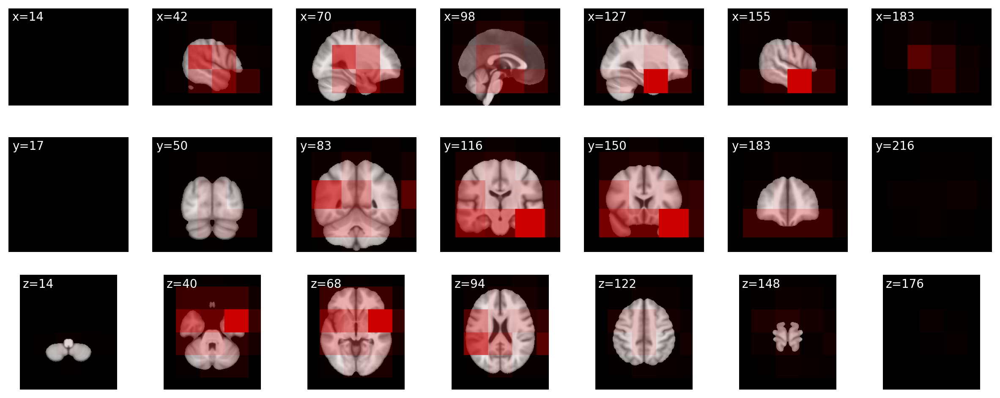

In [55]:
utils.plot_slices(bg, overlay=avg_relevance_map_AD_occlusion, overlay_cmap=utils.alpha_to_red_cmap)

In [56]:
get_relevance_per_area(avg_relevance_map_AD_occlusion)[:10]

[('Temporal_Mid', 0.08266724960688777),
 ('Temporal_Inf', 0.0664698566272187),
 ('Temporal_Sup', 0.049702156790829045),
 ('Temporal_Pole_Sup', 0.042463801891188355),
 ('Fusiform', 0.037568613505719155),
 ('Temporal_Pole_Mid', 0.036977128752613976),
 ('Insula', 0.036787873155415374),
 ('Frontal_Inf_Orb', 0.030938090504428042),
 ('Precuneus', 0.029539988778770232),
 ('Postcentral', 0.028073020070018516)]

0.0 571.9613556588048 1.806201356830019e-09 0.04976831000260632


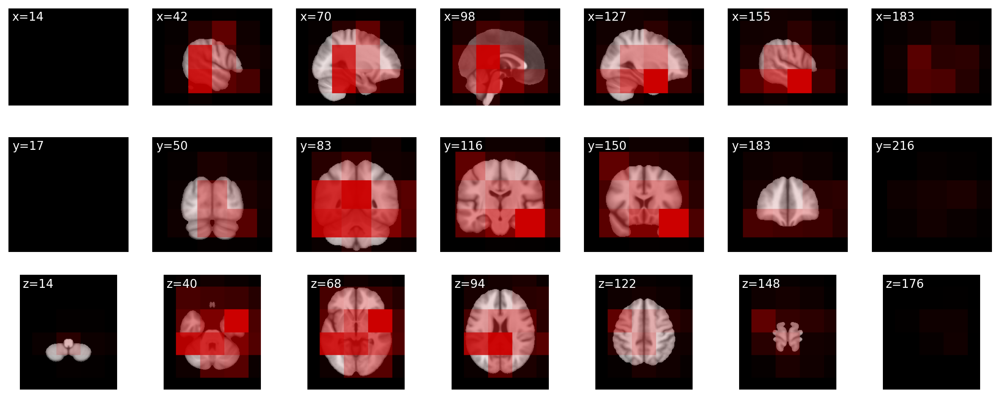

In [57]:
utils.plot_slices(bg, overlay=avg_relevance_map_NC_occlusion, overlay_cmap=utils.alpha_to_red_cmap)

In [58]:
get_relevance_per_area(avg_relevance_map_NC_occlusion)[:10]

[('Temporal_Mid', 0.06803022847601604),
 ('Temporal_Inf', 0.06362235385612372),
 ('Fusiform', 0.041294717085355676),
 ('Precuneus', 0.04079120953395916),
 ('Temporal_Sup', 0.03827478591618739),
 ('Lingual', 0.03131588414156255),
 ('Cerebelum_Crus1', 0.030313297926438762),
 ('Frontal_Mid', 0.029330694983072815),
 ('Precentral', 0.029291497585228303),
 ('Postcentral', 0.02807011330808093)]

## Area Occlusion

In [60]:
avg_relevance_map_AD_area_occlusion, avg_relevance_map_NC_area_occlusion, avg_relevance_map_all_area_occlusion = interpretation.average_over_dataset(interpretation.area_occlusion, net, test_dataset, num_samples=num_samples, seed=0, show_progress=True, cuda=True, area_masks=area_masks)

  0%|          | 0/175 [00:00<?, ?it/s]

0.0 571.9613556588048 0.0 0.060600325


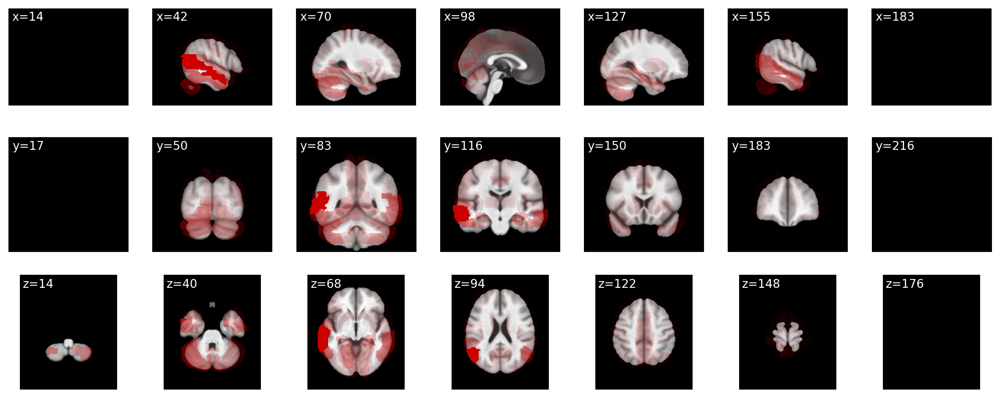

In [61]:
utils.plot_slices(bg, overlay=avg_relevance_map_AD_area_occlusion, overlay_cmap=utils.alpha_to_red_cmap)

In [62]:
get_relevance_per_area(avg_relevance_map_AD_area_occlusion)[:10]

[('Temporal_Mid', 0.22610232789558887),
 ('Temporal_Inf', 0.08684366596323925),
 ('Cerebelum_Crus1', 0.054629184583438434),
 ('Cerebelum_8', 0.04463609135238153),
 ('Lingual', 0.04387398718681951),
 ('Cerebelum_Crus2', 0.04021128908261169),
 ('Cerebelum_6', 0.039810839336235485),
 ('Precuneus', 0.0394092526997704),
 ('Temporal_Sup', 0.03347647985788275),
 ('Fusiform', 0.029942717414776117)]

0.0 571.9613556588048 0.0 0.064582326


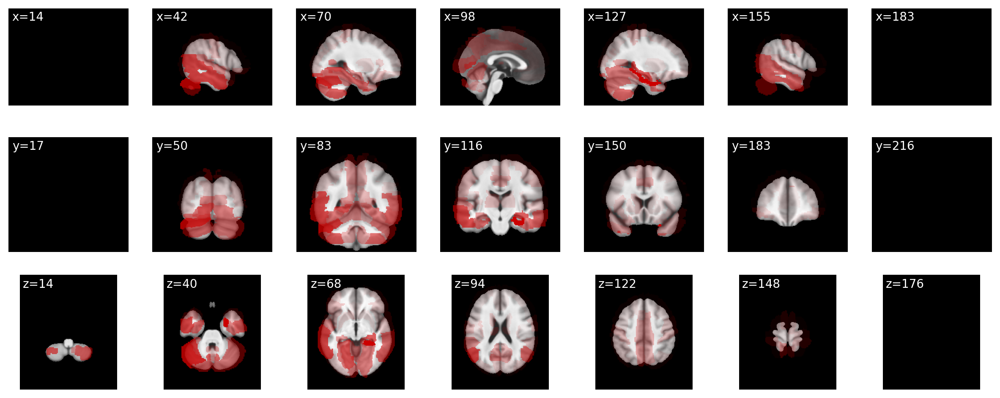

In [63]:
utils.plot_slices(bg, overlay=avg_relevance_map_NC_area_occlusion)

In [64]:
get_relevance_per_area(avg_relevance_map_NC_area_occlusion)[:10]

[('Temporal_Mid', 0.12551467123144683),
 ('Temporal_Inf', 0.09517543106253523),
 ('Cerebelum_Crus1', 0.07395703789332955),
 ('Lingual', 0.053646439085642234),
 ('Cerebelum_8', 0.05277305054446489),
 ('Fusiform', 0.05242558452265783),
 ('Cerebelum_6', 0.04623068558480531),
 ('Cerebelum_Crus2', 0.04281532040928841),
 ('Precuneus', 0.04174378568789393),
 ('ParaHippocampal', 0.03751744790257637)]

## Grad-CAM

In [69]:
avg_relevance_map_AD_grad_cam, avg_relevance_map_NC_grad_cam, avg_relevance_map_all_grad_cam = interpretation.average_over_dataset(interpretation.grad_cam, net, test_dataset, num_samples=10, show_progress=True, resize=True, interpolation=0, cuda=True)

Stored feature maps
tensor([[0., 1.]], device='cuda:0')
Stored gradient
-1.1041762e-05 1.698395e-06 1.657162e-05
(64, 1, 1, 1)
(64, 12, 15, 12)
(12, 15, 12)
-0.0002615067 -0.00010043057 -2.5928572e-05
0.0 0.0 0.0


/home/ntrougkas/Documents/3D-TAME/.venv/lib/python3.8/site-packages/torch/nn/modules/module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/ntrougkas/Documents/3D-TAME/cnn-interpretability/interpretation.py:389: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.softmax(output)


  0%|          | 0/10 [00:00<?, ?it/s]

Stored feature maps
tensor([[0., 1.]], device='cuda:0')
Stored gradient
-0.00010308165 1.3375109e-06 5.3739375e-05
(64, 1, 1, 1)
(64, 12, 15, 12)
(12, 15, 12)
0.00018642558 0.0003838084 0.00070877705
0.00018642558 0.0003838084 0.00070877705
Stored feature maps
tensor([[0., 1.]], device='cuda:0')
Stored gradient
-3.475562e-06 2.2451765e-07 2.1188016e-06
(64, 1, 1, 1)
(64, 12, 15, 12)
(12, 15, 12)
-5.548085e-06 2.5464608e-06 9.275689e-06
0.0 2.819529e-06 9.275689e-06
Stored feature maps
tensor([[0., 1.]], device='cuda:0')
Stored gradient
-3.2073887e-05 2.651429e-06 2.6235643e-05
(64, 1, 1, 1)
(64, 12, 15, 12)
(12, 15, 12)
-0.00026767488 -0.0001101464 1.1673172e-05
0.0 1.6173537e-08 1.1673172e-05
Stored feature maps
tensor([[0., 1.]], device='cuda:0')
Stored gradient
-0.00010223881 1.4987077e-06 5.3299984e-05
(64, 1, 1, 1)
(64, 12, 15, 12)
(12, 15, 12)
0.00018401933 0.00038272847 0.0007176566
0.00018401933 0.00038272847 0.0007176566
Stored feature maps
tensor([[1., 0.]], device='cuda:0')


0.0 571.9613556588048 6.884768e-05 0.00024960606


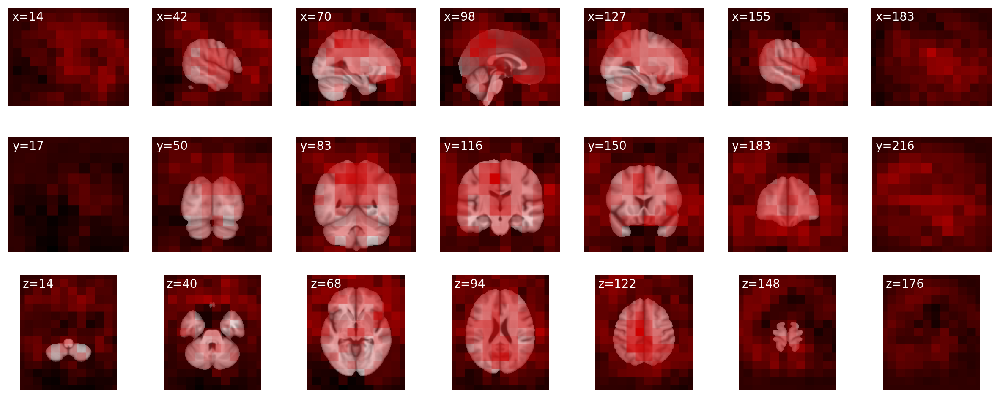

In [71]:
utils.plot_slices(bg, overlay=avg_relevance_map_AD_grad_cam)

In [72]:
get_relevance_per_area(avg_relevance_map_AD_grad_cam)[:10]

[('Frontal_Mid', 0.05338775846514018),
 ('Temporal_Mid', 0.0495063742914427),
 ('Precuneus', 0.04639413213718319),
 ('Postcentral', 0.0442943799087569),
 ('Frontal_Sup', 0.04199856012241196),
 ('Precentral', 0.03638399033035675),
 ('Temporal_Inf', 0.03093277959149529),
 ('Temporal_Sup', 0.030819584258325428),
 ('Frontal_Sup_Medial', 0.030745369450771384),
 ('Frontal_Inf_Tri', 0.02837313385080876)]

0.0 571.9613556588048 6.94987e-05 0.00020113667


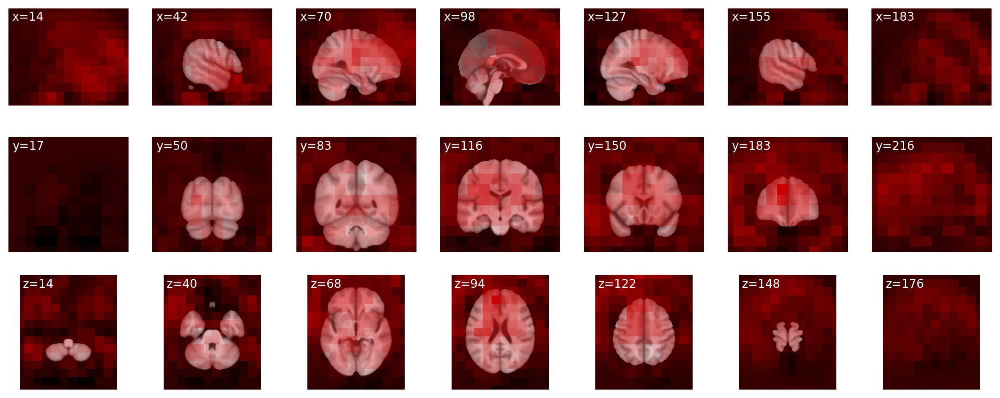

In [74]:
utils.plot_slices(bg, overlay=avg_relevance_map_NC_grad_cam)

In [75]:
get_relevance_per_area(avg_relevance_map_NC_grad_cam)[:10]

[('Frontal_Mid', 0.05831907897070886),
 ('Temporal_Mid', 0.05157833308348286),
 ('Frontal_Sup', 0.047520137735935),
 ('Postcentral', 0.040180035805698025),
 ('Temporal_Inf', 0.03615612106992726),
 ('Precentral', 0.03560567495292999),
 ('Frontal_Sup_Medial', 0.03471870995695679),
 ('Precuneus', 0.0315563557443295),
 ('Temporal_Sup', 0.0305235894056657),
 ('Occipital_Mid', 0.026801143141450372)]

## Save average heatmaps

In [ ]:
# Save heatmaps to file.
#np.savez_compressed('output/relevance_maps_final_compressed.npz', **{
#    'avg_relevance_map_AD_backprop': avg_relevance_map_AD_backprop, 
#    'avg_relevance_map_AD_guided': avg_relevance_map_AD_guided,
#    'avg_relevance_map_AD_occlusion': avg_relevance_map_AD_occlusion,
#    'avg_relevance_map_AD_area_occlusion': avg_relevance_map_AD_area_occlusion,
#    'avg_relevance_map_AD_grad_cam': avg_relevance_map_AD_grad_cam,
    
#    'avg_relevance_map_NC_backprop': avg_relevance_map_NC_backprop, 
#    'avg_relevance_map_NC_guided': avg_relevance_map_NC_guided,
#    'avg_relevance_map_NC_occlusion': avg_relevance_map_NC_occlusion,
#    'avg_relevance_map_NC_area_occlusion': avg_relevance_map_NC_area_occlusion,
#    'avg_relevance_map_NC_grad_cam': avg_relevance_map_NC_grad_cam
#})

# Figures and tables for paper

In [76]:
# Load heatmaps from file.
loaded_heatmaps = np.load('output/relevance_maps_final_compressed.npz')
avg_relevance_map_AD_backprop = loaded_heatmaps['avg_relevance_map_AD_backprop']
avg_relevance_map_AD_guided = loaded_heatmaps['avg_relevance_map_AD_guided']
avg_relevance_map_AD_occlusion = loaded_heatmaps['avg_relevance_map_AD_occlusion']
avg_relevance_map_AD_area_occlusion = loaded_heatmaps['avg_relevance_map_AD_area_occlusion']
avg_relevance_map_AD_grad_cam = loaded_heatmaps['avg_relevance_map_AD_grad_cam']
avg_relevance_map_NC_backprop = loaded_heatmaps['avg_relevance_map_NC_backprop']
avg_relevance_map_NC_guided = loaded_heatmaps['avg_relevance_map_NC_guided']
avg_relevance_map_NC_occlusion = loaded_heatmaps['avg_relevance_map_NC_occlusion']
avg_relevance_map_NC_area_occlusion = loaded_heatmaps['avg_relevance_map_NC_area_occlusion']
avg_relevance_map_NC_grad_cam = loaded_heatmaps['avg_relevance_map_NC_grad_cam']

FileNotFoundError: [Errno 2] No such file or directory: 'output/relevance_maps_final_compressed.npz'

## Figure 1 (Average heatmaps)

In [77]:
def plot_column(struct_arr, axes, title, cmap='gray', vmin=None, vmax=None, overlay=None, overlay_cmap=utils.alpha_to_red_cmap, overlay_vmin=None, overlay_vmax=None):
    if vmin is None:
        vmin = struct_arr.min()
    if vmax is None:
        vmax = struct_arr.max()
    if overlay_vmin is None and overlay is not None:
        overlay_vmin = overlay.min()
    if overlay_vmax is None and overlay is not None:
        overlay_vmax = overlay.max()
    print(vmin, vmax, overlay_vmin, overlay_vmax)
    
    offset = 80
    num_slices = len(axes)
    
    intervals = (np.asarray(struct_arr.shape) - 2 * offset) / (num_slices - 1)
    
    axis = 1
    axis_label = 'y'
    
    #for axes_column in zip(titles):
        
    for i, ax in enumerate(axes):
        #print(axis_label, 'plotting slice', i_slice)
        i_slice = int(np.round(offset + i * intervals[axis]))

        plt.sca(ax)
        ax.get_xaxis().set_ticks([])
        ax.get_yaxis().set_ticks([])
        #plt.axis('off')
        plt.imshow(sp.ndimage.rotate(np.take(struct_arr, i_slice, axis=axis), 90), vmin=vmin, vmax=vmax, 
                   cmap=cmap, interpolation=None)
        plt.text(0.03, 0.97, '{}'.format(i_slice), color='white', 
                 horizontalalignment='left', verticalalignment='top', transform=ax.transAxes)

        if overlay is not None:
            plt.imshow(sp.ndimage.rotate(np.take(overlay, i_slice, axis=axis), 90), cmap=overlay_cmap, 
                       vmin=overlay_vmin, vmax=overlay_vmax, interpolation=None)

        if i == 0:
            plt.title(title + '\n')
            #plt.ylabel('Backpropagation', rotation=0, size='large')
            #ax.get_yaxis().set_label_coords(-0.5, 0.5)

0.0 550 0.0 0.0004253357683774105
0.0 550 0.0 6.581651529995731e-05
0.0 550 1.806201356830019e-09 0.04976831000260632
0.0 550 0.0 0.064582326


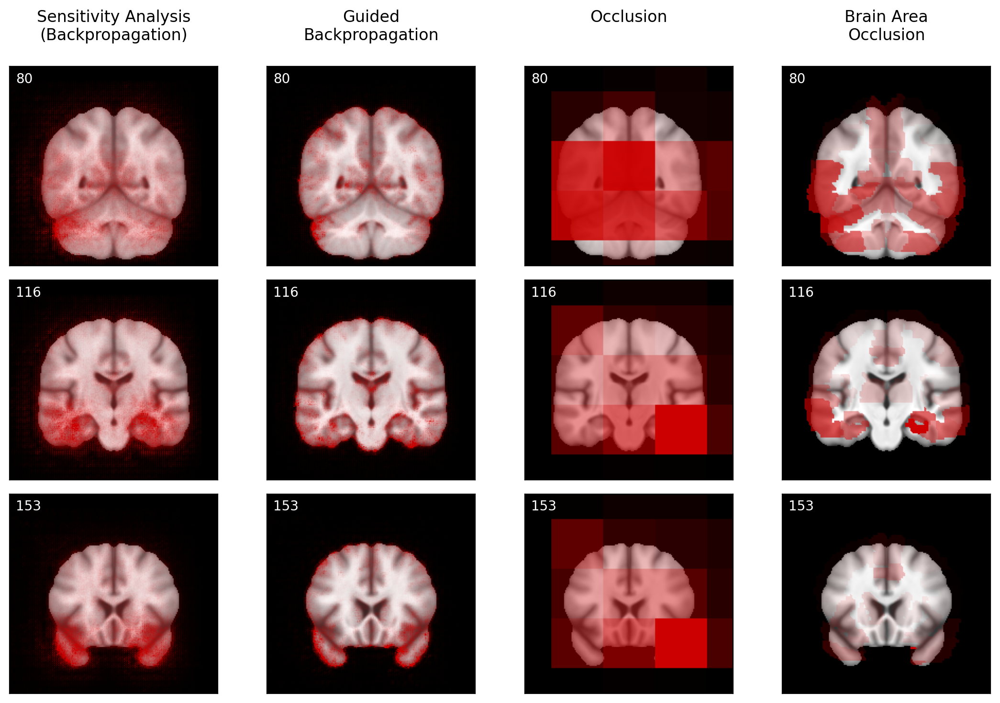

In [78]:
fig, axes = plt.subplots(3, 4, figsize=(11, 7.5))
axes = axes.T

#bg = mask
bg = test_dataset.mean
vmax = 550  # make the background brain a bit lighter

plot_column(bg, axes[0], 'Sensitivity Analysis\n(Backpropagation)', overlay=avg_relevance_map_NC_backprop[0], overlay_vmax=np.percentile(avg_relevance_map_NC_backprop, 99.9), vmax=vmax)
plot_column(bg, axes[1], 'Guided\nBackpropagation', overlay=avg_relevance_map_NC_guided[0], overlay_vmax=np.percentile(avg_relevance_map_NC_guided, 99.9), vmax=vmax)
plot_column(bg, axes[2], 'Occlusion\n', overlay=avg_relevance_map_NC_occlusion, vmax=vmax)
plot_column(bg, axes[3], 'Brain Area\nOcclusion', overlay=avg_relevance_map_NC_area_occlusion, vmax=vmax)
#plot_column(bg, axes[4], 'Grad-CAM\n', overlay=avg_relevance_map_AD_grad_cam, vmax=vmax)
plt.tight_layout()

#plt.savefig('heatmaps-nc.png', dpi=300)

## Table 1 (Most relevant brain areas)

In [79]:
most_relevant_areas_per_method = [
    get_relevance_per_area(avg_relevance_map_AD_backprop)[:4],
    get_relevance_per_area(avg_relevance_map_AD_guided)[:4],
    get_relevance_per_area(avg_relevance_map_AD_occlusion)[:4],
    get_relevance_per_area(avg_relevance_map_AD_area_occlusion)[:4]#,
    #get_relevance_per_area(avg_relevance_map_AD_grad_cam)[:4]
]

In [80]:
lines = []
for i in range(len(most_relevant_areas_per_method[0])):
    line = ' & '.join(['{} ({:.1f} \\%)'.format(areas[i][0].replace('_', ''), areas[i][1]*100) for areas in most_relevant_areas_per_method])
    lines.append(line)
print(' \\\\ \n'.join(lines))  # output in latex format

TemporalMid (6.1 \%) & TemporalMid (7.1 \%) & TemporalMid (8.3 \%) & TemporalMid (22.6 \%) \\ 
TemporalInf (5.6 \%) & TemporalInf (5.1 \%) & TemporalInf (6.6 \%) & TemporalInf (8.7 \%) \\ 
Fusiform (4.3 \%) & FrontalMid (3.9 \%) & TemporalSup (5.0 \%) & CerebelumCrus1 (5.5 \%) \\ 
CerebelumCrus1 (3.6 \%) & OccipitalMid (3.8 \%) & TemporalPoleSup (4.2 \%) & Cerebelum8 (4.5 \%)


## Table 2 (Euclidean distances between heatmaps)

In [81]:
relevance_maps_AD = [avg_relevance_map_AD_backprop, avg_relevance_map_AD_guided, avg_relevance_map_AD_occlusion, avg_relevance_map_AD_area_occlusion]
relevance_maps_NC = [avg_relevance_map_NC_backprop, avg_relevance_map_NC_guided, avg_relevance_map_NC_occlusion, avg_relevance_map_NC_area_occlusion]
names = ['backprop ', 'guided   ', 'occlusion', 'area occl']

In [82]:
scale_factor = 1e-4

print('Euclidean distance between average heatmaps for AD / NC samples in {}'.format(scale_factor))
print()

print('\t\t' + '\t'.join(names))

for a_AD, a_NC, a_name in zip(relevance_maps_AD, relevance_maps_NC, names):
    print(a_name, end='\t')
    for b_AD, b_NC, b_name in zip(relevance_maps_AD, relevance_maps_NC, names):
        print('{:.2f} / {:.2f}'.format(interpretation.heatmap_distance(a_AD, b_AD) / scale_factor, interpretation.heatmap_distance(a_NC, b_NC) / scale_factor), end='\t')
    print()

Euclidean distance between average heatmaps for AD / NC samples in 0.0001

		backprop 	guided   	occlusion	area occl
backprop 	0.00 / 0.00	3.91 / 3.93	4.64 / 3.90	8.91 / 7.62	
guided   	3.91 / 3.93	0.00 / 0.00	6.25 / 5.72	9.23 / 8.17	
occlusion	4.64 / 3.90	6.25 / 5.72	0.00 / 0.00	9.99 / 8.42	
area occl	8.91 / 7.62	9.23 / 8.17	9.99 / 8.42	0.00 / 0.00	


In [84]:
print('Euclidean distance between AD and NC heatmaps for each method in {}'.format(scale_factor))
print()

print('\t'.join(names))
for a, b in zip(relevance_maps_AD, relevance_maps_NC):
    print('{:.2f}'.format(interpretation.heatmap_distance(a, b) / scale_factor), end='\t\t')

Euclidean distance between AD and NC heatmaps for each method in 0.0001

backprop 	guided   	occlusion	area occl
1.22		2.49		2.91		4.52		

# Export to Animation and MRIcron

In [85]:
anim = utils.animate_slices(test_dataset.mean, overlay=avg_relevance_map_AD_guided[0], overlay_vmax=np.percentile(avg_relevance_map_AD_guided, 99.9), axis=2, reverse_direction=True, interval=70)
plt.close()  # suppress plot output

In [86]:
plt.rcParams['animation.ffmpeg_path'] = u'/home/johannesr/ffmpeg-3.4.1-64bit-static/ffmpeg'    

In [90]:
# Display the animation inline.
from IPython.display import HTML
HTML(anim.to_html5_video())

RuntimeError: Requested MovieWriter (ffmpeg) not available

In [45]:
anim.save('data/anim-guided.gif')

ValueError: I/O operation on closed file

In [ ]:
# You can also save the relevance map in NIFTI format and load it as an overlay in MRIcron (https://www.nitrc.org/projects/mricron) later.
#utils.save_nifti('guided_backprop.nii', relevance_map_guided[0])